In [229]:
import numpy as np
import pandas as pd
from matplotlib.patches import ArrowStyle, ConnectionStyle
import pandas as pd 
import numpy as np 
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from urllib.request import urlopen
from bs4 import BeautifulSoup
import plotly.express as px
import folium



In [230]:
StockX = pd.read_excel('Project Dataset (StockX 2019 contest).xlsx')

StockX.head()

,Order Date,Brand,Sneaker Name,Sale Price,Retail Price,Release Date,Shoe Size,Buyer Region
0,2017-09-01,Yeezy,Adidas-Yeezy-Boost-350-Low-V2-Beluga,1097,220,2016-09-24,11.0,California
1,2017-09-01,Yeezy,Adidas-Yeezy-Boost-350-V2-Core-Black-Copper,685,220,2016-11-23,11.0,California
2,2017-09-01,Yeezy,Adidas-Yeezy-Boost-350-V2-Core-Black-Green,690,220,2016-11-23,11.0,California
3,2017-09-01,Yeezy,Adidas-Yeezy-Boost-350-V2-Core-Black-Red,1075,220,2016-11-23,11.5,Kentucky
4,2017-09-01,Yeezy,Adidas-Yeezy-Boost-350-V2-Core-Black-Red-2017,828,220,2017-02-11,11.0,Rhode Island


In [231]:
%matplotlib inline

In [232]:
import matplotlib as mpl
import matplotlib.pyplot as plt

In [233]:
# Add "Profit/Loss" column

StockX['Profit/Loss']= StockX['Sale Price'] - StockX['Retail Price']

# Rename Region column to State
StockX.rename(columns={'Buyer Region':'Buyer State'},inplace=True)

In [234]:
# Filter data for the year 2018 only
StockX_2018 = StockX.loc[(StockX['Order Date'] >= '2018-01-01')
                     & (StockX['Order Date'] < '2019-01-01')]

StockX_2018.drop(['Retail Price', 'Release Date', 'Profit/Loss'], axis=1, inplace=True)

StockX_2018

/var/folders/v5/c9bvq72j1kj2513_tg5wvrkh0000gn/T/ipykernel_29591/3456804612.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Order Date,Brand,Sneaker Name,Sale Price,Shoe Size,Buyer State
13293,2018-01-01,Yeezy,Adidas-Yeezy-Boost-350-Low-Pirate-Black-2015,875,10.5,Texas
13294,2018-01-01,Yeezy,Adidas-Yeezy-Boost-350-V2-Beluga-2pt0,378,6.0,Colorado
13295,2018-01-01,Yeezy,Adidas-Yeezy-Boost-350-V2-Beluga-2pt0,375,10.0,California
13296,2018-01-01,Yeezy,Adidas-Yeezy-Boost-350-V2-Beluga-2pt0,390,10.0,Florida
13297,2018-01-01,Yeezy,Adidas-Yeezy-Boost-350-V2-Beluga-2pt0,370,8.5,California
...,...,...,...,...,...,...
83758,2018-12-31,Yeezy,adidas-Yeezy-Boost-350-V2-Static-Reflective,535,9.5,California
83759,2018-12-31,Yeezy,adidas-Yeezy-Boost-350-V2-Static-Reflective,495,8.5,California
83760,2018-12-31,Yeezy,adidas-Yeezy-Boost-350-V2-Static-Reflective,575,10.5,Texas
83761,2018-12-31,Yeezy,adidas-Yeezy-Boost-350-V2-Static-Reflective,550,9.5,Florida


Stock X 2018 Purchases in Georgia

In [235]:
StockX_2018GA = StockX_2018.loc[(StockX_2018['Buyer State'] == 'Georgia')]
StockX_2018GA

,Order Date,Brand,Sneaker Name,Sale Price,Shoe Size,Buyer State
13314,2018-01-01,Yeezy,Adidas-Yeezy-Boost-350-V2-Beluga-2pt0,420,12.0,Georgia
13350,2018-01-01,Yeezy,Adidas-Yeezy-Boost-350-V2-Blue-Tint,370,10.5,Georgia
13358,2018-01-01,Yeezy,Adidas-Yeezy-Boost-350-V2-Blue-Tint,339,9.0,Georgia
13376,2018-01-01,Yeezy,Adidas-Yeezy-Boost-350-V2-Blue-Tint,370,12.0,Georgia
13386,2018-01-01,Yeezy,Adidas-Yeezy-Boost-350-V2-Blue-Tint,350,9.5,Georgia
...,...,...,...,...,...,...
83555,2018-12-31,Yeezy,Adidas-Yeezy-Boost-350-V2-Zebra,317,10.0,Georgia
83556,2018-12-31,Yeezy,Adidas-Yeezy-Boost-350-V2-Zebra,299,8.0,Georgia
83626,2018-12-31,Off-White,Nike-Zoom-Fly-Off-White-Pink,272,12.0,Georgia
83644,2018-12-31,Yeezy,adidas-Yeezy-Boost-350-V2-Static,285,11.5,Georgia


In [236]:
# Yeezy 2018 Stock X Sales

StockX_2018Y = StockX_2018.loc[StockX_2018['Brand'] == 'Yeezy']

StockX_2018Y.head()



,Order Date,Brand,Sneaker Name,Sale Price,Shoe Size,Buyer State


# Stock X 2018 Sales, in Georgia, by Sneaker Name 

In [237]:
!pip install plotly
import plotly.express as px

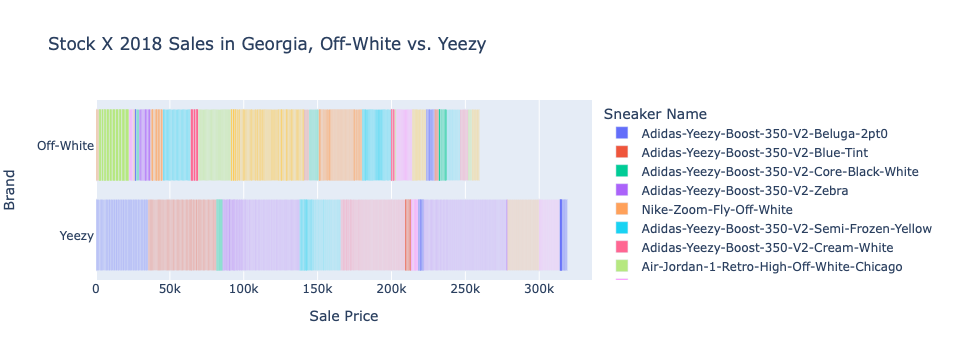

In [238]:
px.bar(StockX_2018GA, 
       y='Brand', 
       x='Sale Price', 
       hover_name='Sneaker Name', 
       color='Sneaker Name', 
       title='Stock X 2018 Sales in Georgia, Off-White vs. Yeezy',
       )

In [239]:
# px.scatter(StockX_2018GA, 
#        x='Sale Price',
#        y='Brand', 
#        hover_name='Sneaker Name', 
#        color='Sneaker Name',
#        size='Sneaker Name', 
#        title='Stock X 2018 Sales in Georgia, Off-White vs. Yeezy',
#        animation_frame='month',
#        height=500
#        )

# px.scatter(df, x='gdpPercap', y='lifeExp', hover_name='country', color='continent', size='pop', log_x=True, animation_frame='year', height=500)

# States Where Yeezys are Sold



In [240]:
import folium
!pip install geopandas

In [241]:
import geopandas as gpd

In [242]:
# StockX_USA = gpd.read_file('C:\Users\rgreen43\OneDrive\Documents\GSU MSDA Studies\MSA 8020 - Data Visualization\states\states.geojson')

StockX_USA = gpd.read_file('states.geojson')
StockX_USA.head()

,STATEFP,STUSPS,NAME,geometry
0,31,NE,Nebraska,"MULTIPOLYGON (((-104.05303 43.00059, -103.6183..."
1,53,WA,Washington,"MULTIPOLYGON (((-122.52603 47.35891, -122.5139..."
2,35,NM,New Mexico,"MULTIPOLYGON (((-109.04522 36.99908, -108.6460..."
3,46,SD,South Dakota,"MULTIPOLYGON (((-104.05770 44.99743, -104.0397..."
4,21,KY,Kentucky,"MULTIPOLYGON (((-89.13268 36.98220, -89.16645 ..."


In [243]:
# StockX_2018_Y

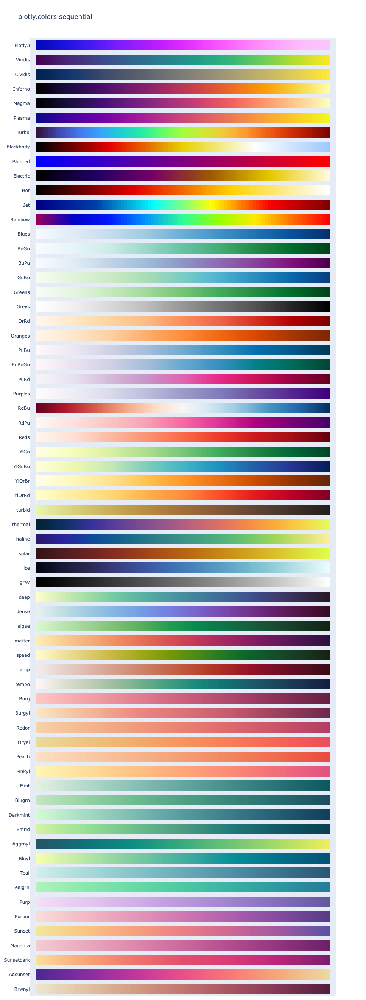

In [244]:
import plotly.express as px

fig = px.colors.sequential.swatches_continuous()
fig.show()

In [245]:
StockX_2018

,Order Date,Brand,Sneaker Name,Sale Price,Shoe Size,Buyer State
13293,2018-01-01,Yeezy,Adidas-Yeezy-Boost-350-Low-Pirate-Black-2015,875,10.5,Texas
13294,2018-01-01,Yeezy,Adidas-Yeezy-Boost-350-V2-Beluga-2pt0,378,6.0,Colorado
13295,2018-01-01,Yeezy,Adidas-Yeezy-Boost-350-V2-Beluga-2pt0,375,10.0,California
13296,2018-01-01,Yeezy,Adidas-Yeezy-Boost-350-V2-Beluga-2pt0,390,10.0,Florida
13297,2018-01-01,Yeezy,Adidas-Yeezy-Boost-350-V2-Beluga-2pt0,370,8.5,California
...,...,...,...,...,...,...
83758,2018-12-31,Yeezy,adidas-Yeezy-Boost-350-V2-Static-Reflective,535,9.5,California
83759,2018-12-31,Yeezy,adidas-Yeezy-Boost-350-V2-Static-Reflective,495,8.5,California
83760,2018-12-31,Yeezy,adidas-Yeezy-Boost-350-V2-Static-Reflective,575,10.5,Texas
83761,2018-12-31,Yeezy,adidas-Yeezy-Boost-350-V2-Static-Reflective,550,9.5,Florida


In [246]:
StockX_2018.drop(['Shoe Size', 'Order Date', 'Sneaker Name'], axis=1, inplace=True)

StockX_2018

/var/folders/v5/c9bvq72j1kj2513_tg5wvrkh0000gn/T/ipykernel_29591/3399256719.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Brand,Sale Price,Buyer State
13293,Yeezy,875,Texas
13294,Yeezy,378,Colorado
13295,Yeezy,375,California
13296,Yeezy,390,Florida
13297,Yeezy,370,California
...,...,...,...
83758,Yeezy,535,California
83759,Yeezy,495,California
83760,Yeezy,575,Texas
83761,Yeezy,550,Florida


In [247]:
StockX_2018=StockX_2018.groupby('Buyer State', axis=0).sum()

StockX_2018.reset_index()

StockX_2018.head()

,Sale Price
Buyer State,
Alabama,117312
Alaska,20309
Arizona,475045
Arkansas,51284
California,6457851


In [248]:
StockX_2018.reset_index(inplace=True)

In [249]:
StockX_2018.head()

,Buyer State,Sale Price
0,Alabama,117312
1,Alaska,20309
2,Arizona,475045
3,Arkansas,51284
4,California,6457851


In [250]:
US_map = folium.Map(location=[41, -98], zoom_start=4)

StockX_18Sales = StockX_2018.loc[np.isfinite(StockX_2018['Sale Price'])]

US_map.choropleth(geo_data = StockX_USA, 
                  data = StockX_2018, 
                  columns = ['Buyer State', 'Sale Price'], 
                  key_on = 'feature.properties.NAME',
                  fill_color = 'OrRd', 
                  fill_opacity = 0.80, 
                  line_opacity = 0.60
                  )

US_map

In [251]:
#JONATHAN CRUZ
#New cleaned CSV with both brands 
df_s = pd.read_csv(
    'Sneakers.csv')

In [252]:
df_s=df_s.drop(columns=['Unnamed: 0'])

In [253]:

#Clean Data Again 
df_s['Sneaker Name'] = df_s['Sneaker Name'].apply(lambda x: x.replace('-', ' '))

In [254]:
df_s["Brought for below Retail"]= df_s['Sale Price']<df_s['Retail Price']
df_s["Brought for Retail"]= df_s['Sale Price']== df_s['Retail Price']
df_s["Brought for above Retail"]= df_s['Sale Price']>df_s['Retail Price']

print(df_s)

        Brand                                   Sneaker Name  Sale Price  \
0       Yeezy           Adidas Yeezy Boost 350 Low V2 Beluga      1097.0   
1       Yeezy    Adidas Yeezy Boost 350 V2 Core Black Copper       685.0   
2       Yeezy     Adidas Yeezy Boost 350 V2 Core Black Green       690.0   
3       Yeezy       Adidas Yeezy Boost 350 V2 Core Black Red      1075.0   
4       Yeezy  Adidas Yeezy Boost 350 V2 Core Black Red 2017       828.0   
...       ...                                            ...         ...   
99951   Yeezy    adidas Yeezy Boost 350 V2 Static Reflective       565.0   
99952   Yeezy    adidas Yeezy Boost 350 V2 Static Reflective       598.0   
99953   Yeezy    adidas Yeezy Boost 350 V2 Static Reflective       605.0   
99954   Yeezy    adidas Yeezy Boost 350 V2 Static Reflective       650.0   
99955   Yeezy    adidas Yeezy Boost 350 V2 Static Reflective       640.0   

       Retail Price Release Date  Shoe Size  Buyer Region  Profit  \
0               22

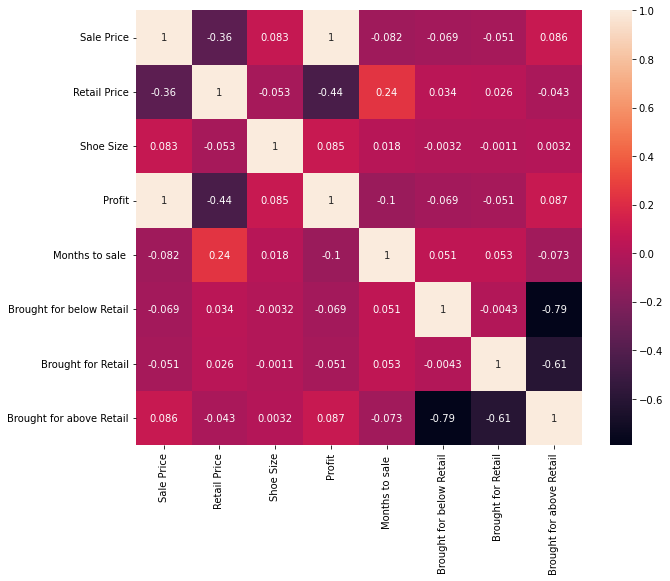

In [255]:


#Correlation Map 
fig, ax = plt.subplots(figsize=(10, 8))

correlations = df_s.corr()
sns.heatmap(correlations,annot=True)
plt.show()

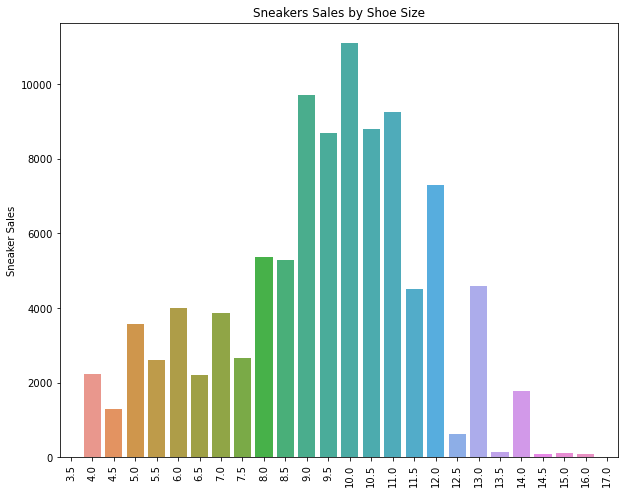

In [256]:

df_need = [   'Shoe Size']
for s in df_need:
    snk_num= df_s[str(s)].value_counts() 
    plt.figure(figsize=(10,8))
    s_chart= sns.barplot(x=snk_num.index,y=snk_num)
    s_chart.set_title("Sneakers Sales by %s" % (s))
    plt.ylabel("Sneaker Sales")
    s_chart.set_xticklabels(s_chart.get_xticklabels(), rotation = 90)
    plt.gca().xaxis.set_major_locator(plt.MultipleLocator(1))
    plt.show()

In [257]:
#Ikenine
STOCKX = 'StockX Yeezy Data.xlsx'
#STOCKX2 = 'StockX Yeezy Data.xlsx'

In [258]:
df_shoes = pd.read_excel(STOCKX)
#df_shoes2 = pd.read_csv(STOCKX2)

In [259]:
# All the retail information for the Georgia region
df_GA = df_shoes[df_shoes['Buyer Region'] == 'Georgia']
df_GA

,Order Date,Brand,Sneaker Name,Sale Price,Retail Price,Release Date,Shoe Size,Buyer Region
66,2017-09-04,Yeezy,Adidas-Yeezy-Boost-350-V2-Zebra,575.0,220,2017-02-25,8.5,Georgia
93,2017-09-06,Yeezy,Adidas-Yeezy-Boost-350-Low-V2-Beluga,904.0,220,2016-09-24,7.5,Georgia
97,2017-09-06,Yeezy,Adidas-Yeezy-Boost-350-V2-Core-Black-Red-2017,815.0,220,2017-02-11,11.0,Georgia
135,2017-09-08,Yeezy,Adidas-Yeezy-Boost-350-V2-Core-Black-Red-2017,875.0,220,2017-02-11,11.5,Georgia
387,2017-09-17,Off-White,Air-Jordan-1-Retro-High-Off-White-Chicago,1910.0,190,2017-09-09,10.0,Georgia
...,...,...,...,...,...,...,...,...
99513,2019-02-12,Off-White,Nike-Zoom-Fly-Off-White-Black-Silver,350.0,170,2018-10-13,9.5,Georgia
99646,2019-02-13,Yeezy,Adidas-Yeezy-Boost-350-V2-Cream-White,250.0,220,2017-04-29,9.5,Georgia
99655,2019-02-13,Yeezy,Adidas-Yeezy-Boost-350-V2-Semi-Frozen-Yellow,248.0,220,2017-11-18,9.5,Georgia
99675,2019-02-13,Yeezy,Adidas-Yeezy-Boost-350-V2-Semi-Frozen-Yellow,245.0,220,2017-11-18,9.0,Georgia


In [260]:
# The amount of shoes sold in the U.S. grouped by Brand
df_CO = df_shoes.groupby('Brand')['Brand'].count()
print(df_CO)

Brand
 Yeezy       72162
Off-White    27794
Name: Brand, dtype: int64


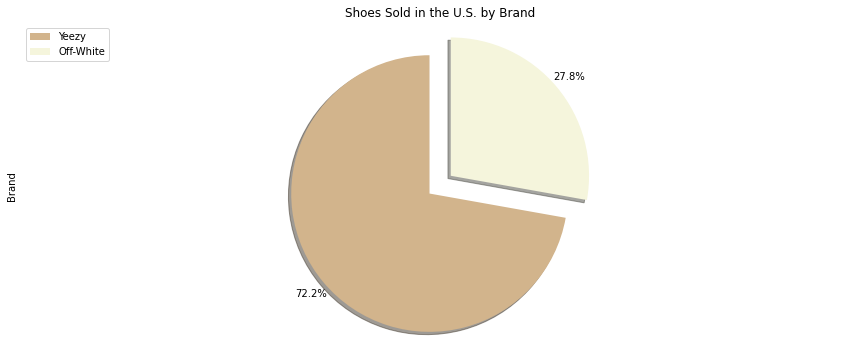

In [261]:
#Pie chart that displays the proportion of shoes sold in the U.S. grouped by brand
colors_list = ['tan', 'beige']
explode_list = [0.1, 0.1]


df_CO.plot(kind='pie',
                            figsize=(15,6),
                            autopct='%1.1f%%', 
                            startangle=90, 
                            shadow=True,
                            labels=None,
                            pctdistance=1.12, 
                            colors = colors_list,
                            explode = explode_list, 
                            )
plt.title('Shoes Sold in the U.S. by Brand')
plt.axis('equal') 

plt.legend(labels= ['Yeezy', 'Off-White'], loc= 'upper left')

plt.show()

In [262]:
# Revnue earned from shoes sales in the U.S. grouped by brand
df_Rev = df_shoes.groupby('Brand')['Sale Price'].sum()
print(df_Rev)

Brand
 Yeezy       2.598067e+07
Off-White    1.866315e+07
Name: Sale Price, dtype: float64


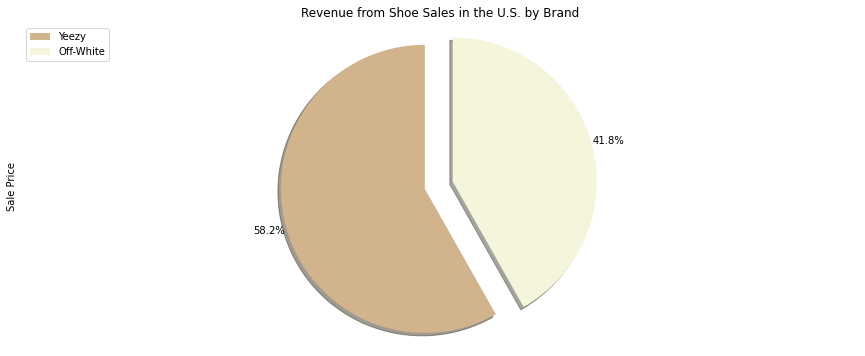

In [263]:
# Pie chart that displays the proportion revenue earned from shoes sales in the U.S. grouped by brand
colors_list = ['tan', 'beige']
explode_list = [0.1, 0.1]


df_Rev.plot(kind='pie',
                            figsize=(15,6),
                            autopct='%1.1f%%', 
                            startangle=90, 
                            shadow=True,
                            labels=None,
                            pctdistance=1.12, 
                            colors = colors_list,
                            explode = explode_list, 
                            )
plt.title('Revenue from Shoe Sales in the U.S. by Brand')
plt.axis('equal') 

plt.legend(labels= ['Yeezy', 'Off-White'], loc= 'upper left')

plt.show()

In [264]:
# The amount of shoes sold in Georgia grouped by Brand
df_GS = df_GA.groupby('Brand')['Brand'].count()
print(df_GS)

Brand
 Yeezy       1318
Off-White     528
Name: Brand, dtype: int64


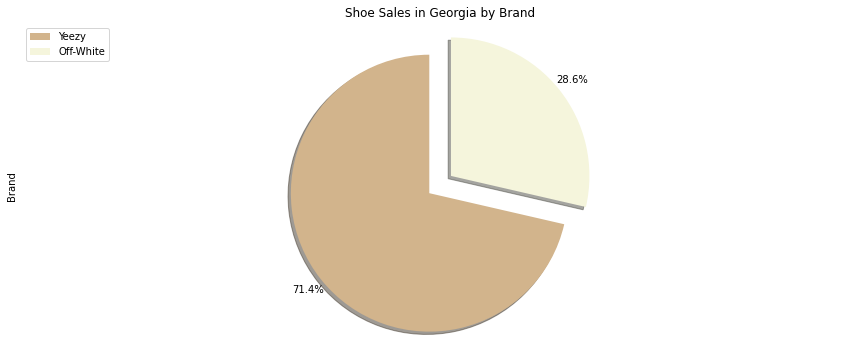

In [265]:
# Pie chart that displays the proportion of shoes sold in Georgia grouped by brand
colors_list = ['tan', 'beige']
explode_list = [0.1, 0.1]


df_GS.plot(kind='pie',
                            figsize=(15,6),
                            autopct='%1.1f%%', 
                            startangle=90, 
                            shadow=True,
                            labels=None,
                            pctdistance=1.12, 
                            colors = colors_list,
                            explode = explode_list, 
                            )
plt.title('Shoe Sales in Georgia by Brand')
plt.axis('equal') 

plt.legend(labels= ['Yeezy', 'Off-White'], loc= 'upper left')

plt.show()

In [266]:
# Revnue earned from shoes sales in Georgia grouped by brand
df_GR = df_GA.groupby('Brand')['Sale Price'].sum()
print(df_GR)

Brand
 Yeezy       454555.3586
Off-White    340594.0000
Name: Sale Price, dtype: float64


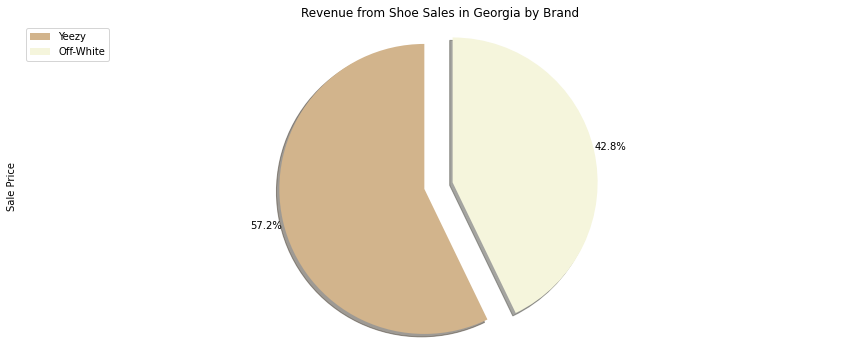

In [267]:
# Pie chart that displays the proportion revenue earned from shoes sales in Georgia grouped by brand
colors_list = ['tan', 'beige']
explode_list = [0.1, 0.1]


df_GR.plot(kind='pie',
                            figsize=(15,6),
                            autopct='%1.1f%%', 
                            startangle=90, 
                            shadow=True,
                            labels=None,
                            pctdistance=1.12, 
                            colors = colors_list,
                            explode = explode_list, 
                            )
plt.title('Revenue from Shoe Sales in Georgia by Brand')
plt.axis('equal') 

plt.legend(labels= ['Yeezy', 'Off-White'], loc= 'upper left')

plt.show()

In [268]:
# Group all the shoes by their sneaker name and calculate the sum of their sales (Sale Price)
df_MAX = df_shoes.groupby('Sneaker Name')['Sale Price'].sum()
print(df_MAX)

Sneaker Name
Adidas-Yeezy-Boost-350-Low-Moonrock                  9.967100e+04
Adidas-Yeezy-Boost-350-Low-Oxford-Tan                7.080600e+04
Adidas-Yeezy-Boost-350-Low-Pirate-Black-2015         8.503400e+04
Adidas-Yeezy-Boost-350-Low-Pirate-Black-2016         1.200770e+05
Adidas-Yeezy-Boost-350-Low-Turtledove                1.041530e+05
Adidas-Yeezy-Boost-350-Low-V2-Beluga                 3.927750e+05
Adidas-Yeezy-Boost-350-V2-Beluga-2pt0                4.162570e+06
Adidas-Yeezy-Boost-350-V2-Blue-Tint                  3.523434e+06
Adidas-Yeezy-Boost-350-V2-Core-Black-Copper          1.477420e+05
Adidas-Yeezy-Boost-350-V2-Core-Black-Green           1.220690e+05
Adidas-Yeezy-Boost-350-V2-Core-Black-Red             2.832020e+05
Adidas-Yeezy-Boost-350-V2-Core-Black-Red-2017        7.793710e+05
Adidas-Yeezy-Boost-350-V2-Core-Black-White           4.461340e+05
Adidas-Yeezy-Boost-350-V2-Cream-White                2.626385e+06
Adidas-Yeezy-Boost-350-V2-Semi-Frozen-Yellow         1.895909e+

In [269]:
# Sort values into descending order to find shoe that generated the most revenue
df_MAX.sort_values(ascending=True)

Sneaker Name
Nike-Air-Force-1-Low-Virgil-Abloh-Off-White-AF100    3.024100e+04
Adidas-Yeezy-Boost-350-Low-Oxford-Tan                7.080600e+04
Adidas-Yeezy-Boost-350-Low-Pirate-Black-2015         8.503400e+04
Adidas-Yeezy-Boost-350-Low-Moonrock                  9.967100e+04
Adidas-Yeezy-Boost-350-Low-Turtledove                1.041530e+05
Adidas-Yeezy-Boost-350-Low-Pirate-Black-2016         1.200770e+05
Adidas-Yeezy-Boost-350-V2-Core-Black-Green           1.220690e+05
Adidas-Yeezy-Boost-350-V2-Core-Black-Copper          1.477420e+05
Nike-Zoom-Fly-Mercurial-Off-White-Total-Orange       1.888720e+05
Nike-Air-Max-97-Off-White-Elemental-Rose-Queen       1.930570e+05
Nike-Air-Max-97-Off-White-Black                      1.942370e+05
Nike-Blazer-Mid-Off-White-Wolf-Grey                  2.260290e+05
Nike-Zoom-Fly-Mercurial-Off-White-Black              2.284160e+05
Nike-Zoom-Fly-Off-White                              2.326450e+05
Nike-React-Hyperdunk-2017-Flyknit-Off-White          2.395540e+

In [270]:
# Select all the records of the shoe that generated the most revenue
df_V = df_shoes[df_shoes['Sneaker Name'] == 'Nike-Air-Force-1-Low-Virgil-Abloh-Off-White-AF100']
df_V

,Order Date,Brand,Sneaker Name,Sale Price,Retail Price,Release Date,Shoe Size,Buyer Region
1397,2017-11-06,Off-White,Nike-Air-Force-1-Low-Virgil-Abloh-Off-White-AF100,850.0,150,2017-11-04,10.0,California
1448,2017-11-08,Off-White,Nike-Air-Force-1-Low-Virgil-Abloh-Off-White-AF100,775.0,150,2017-11-04,12.0,Florida
1494,2017-11-09,Off-White,Nike-Air-Force-1-Low-Virgil-Abloh-Off-White-AF100,1100.0,150,2017-11-04,9.5,Colorado
1543,2017-11-10,Off-White,Nike-Air-Force-1-Low-Virgil-Abloh-Off-White-AF100,910.0,150,2017-11-04,10.0,Texas
1780,2017-11-14,Off-White,Nike-Air-Force-1-Low-Virgil-Abloh-Off-White-AF100,841.0,150,2017-11-04,10.5,New York
1924,2017-11-16,Off-White,Nike-Air-Force-1-Low-Virgil-Abloh-Off-White-AF100,950.0,150,2017-11-04,9.0,Maine
2020,2017-11-17,Off-White,Nike-Air-Force-1-Low-Virgil-Abloh-Off-White-AF100,870.0,150,2017-11-04,11.0,California
2021,2017-11-17,Off-White,Nike-Air-Force-1-Low-Virgil-Abloh-Off-White-AF100,785.0,150,2017-11-04,7.5,California
2134,2017-11-18,Off-White,Nike-Air-Force-1-Low-Virgil-Abloh-Off-White-AF100,770.0,150,2017-11-04,4.0,Pennsylvania
2261,2017-11-19,Off-White,Nike-Air-Force-1-Low-Virgil-Abloh-Off-White-AF100,710.0,150,2017-11-04,11.0,Delaware


In [271]:
# Select Sneaker Name as the index
df_V.set_index('Sneaker Name')

,Order Date,Brand,Sale Price,Retail Price,Release Date,Shoe Size,Buyer Region
Sneaker Name,,,,,,,
Nike-Air-Force-1-Low-Virgil-Abloh-Off-White-AF100,2017-11-06,Off-White,850.0,150,2017-11-04,10.0,California
Nike-Air-Force-1-Low-Virgil-Abloh-Off-White-AF100,2017-11-08,Off-White,775.0,150,2017-11-04,12.0,Florida
Nike-Air-Force-1-Low-Virgil-Abloh-Off-White-AF100,2017-11-09,Off-White,1100.0,150,2017-11-04,9.5,Colorado
Nike-Air-Force-1-Low-Virgil-Abloh-Off-White-AF100,2017-11-10,Off-White,910.0,150,2017-11-04,10.0,Texas
Nike-Air-Force-1-Low-Virgil-Abloh-Off-White-AF100,2017-11-14,Off-White,841.0,150,2017-11-04,10.5,New York
Nike-Air-Force-1-Low-Virgil-Abloh-Off-White-AF100,2017-11-16,Off-White,950.0,150,2017-11-04,9.0,Maine
Nike-Air-Force-1-Low-Virgil-Abloh-Off-White-AF100,2017-11-17,Off-White,870.0,150,2017-11-04,11.0,California
Nike-Air-Force-1-Low-Virgil-Abloh-Off-White-AF100,2017-11-17,Off-White,785.0,150,2017-11-04,7.5,California
Nike-Air-Force-1-Low-Virgil-Abloh-Off-White-AF100,2017-11-18,Off-White,770.0,150,2017-11-04,4.0,Pennsylvania


In [272]:
# Selecting the Shoe Size column 
df_SS = df_V['Shoe Size']
df_SS

1397     10.0
1448     12.0
1494      9.5
1543     10.0
1780     10.5
1924      9.0
2020     11.0
2021      7.5
2134      4.0
2261     11.0
2395      6.5
2396     10.5
2563     10.0
4958     10.0
5903      8.5
6205      9.0
6206     10.5
6459     11.0
7192     10.5
8080      5.0
8269     10.5
8829     11.5
10831    10.0
14216     9.5
17225    10.0
20226    12.0
20309     9.0
20473    10.0
20701    10.0
20945    11.0
26279     7.0
Name: Shoe Size, dtype: float64

In [273]:
# Dropping duplicates of shoes that are the same size
df_SS = df_SS.drop_duplicates()
df_SS

1397     10.0
1448     12.0
1494      9.5
1780     10.5
1924      9.0
2020     11.0
2021      7.5
2134      4.0
2395      6.5
5903      8.5
8080      5.0
8829     11.5
26279     7.0
Name: Shoe Size, dtype: float64

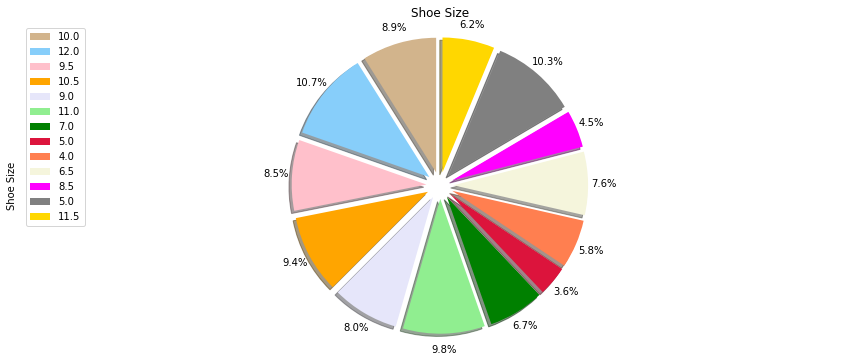

In [274]:
# Pie chart that displays the shoe size percentages for the shoe that generates the most revenue
colors_list = ['tan', 'lightskyblue', 'pink', 'orange', 'lavender', 'lightgreen', 'green', 'crimson', 'coral', 'beige', 'magenta', 'grey', 'gold']
explode_list = [0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1]



df_SS.plot(kind='pie',
                            figsize=(15,6),
                            autopct='%1.1f%%', # add percentages
                            startangle=90, # start angle 90 (Africa)
                            shadow=True,
                            labels=None,
                            pctdistance=1.12, # ratio between center of each pie slice and percentage location
                            colors = colors_list,
                            explode = explode_list, # 'explode' lowest three continents
                            )
plt.title('Shoe Size')
plt.axis('equal') # sets the pie chart to look like a circle

plt.legend(labels=[10.0, 12.0, 9.5, 10.5, 9.0, 11.0, 7.0, 5.0, 4.0, 6.5, 8.5, 5.0, 11.5, 7.0], loc= 'upper left')

plt.show()

In [275]:
# The amount of revenue each shoe has generated in the Georgia region (Sale Price)
df_SA = df_GA.groupby('Sneaker Name')['Sale Price'].sum()
print(df_SA)

Sneaker Name
Adidas-Yeezy-Boost-350-Low-V2-Beluga                  7816.0000
Adidas-Yeezy-Boost-350-V2-Beluga-2pt0                71597.0000
Adidas-Yeezy-Boost-350-V2-Blue-Tint                  66138.0000
Adidas-Yeezy-Boost-350-V2-Core-Black-Copper           2115.0000
Adidas-Yeezy-Boost-350-V2-Core-Black-Green             699.0000
Adidas-Yeezy-Boost-350-V2-Core-Black-Red              4725.0000
Adidas-Yeezy-Boost-350-V2-Core-Black-Red-2017         7357.0000
Adidas-Yeezy-Boost-350-V2-Core-Black-White            4921.0000
Adidas-Yeezy-Boost-350-V2-Cream-White                54671.3586
Adidas-Yeezy-Boost-350-V2-Semi-Frozen-Yellow         49785.0000
Adidas-Yeezy-Boost-350-V2-Sesame                     29654.0000
Adidas-Yeezy-Boost-350-V2-Zebra                      61878.0000
Air-Jordan-1-Retro-High-Off-White-Chicago            35637.0000
Air-Jordan-1-Retro-High-Off-White-University-Blue    53202.0000
Air-Jordan-1-Retro-High-Off-White-White               5375.0000
Nike-Air-Force-1-Low-Off-Wh

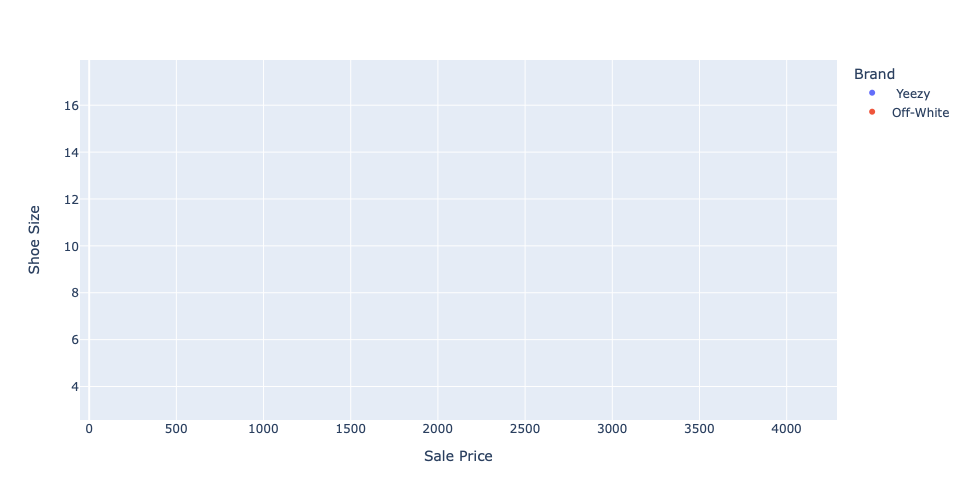

In [276]:
# Displays which shoes were sold at a certain price based on shoe size and grouped by color
px.scatter(df_shoes, x='Sale Price', y='Shoe Size', hover_name='Sneaker Name', color = 'Brand', height=500)

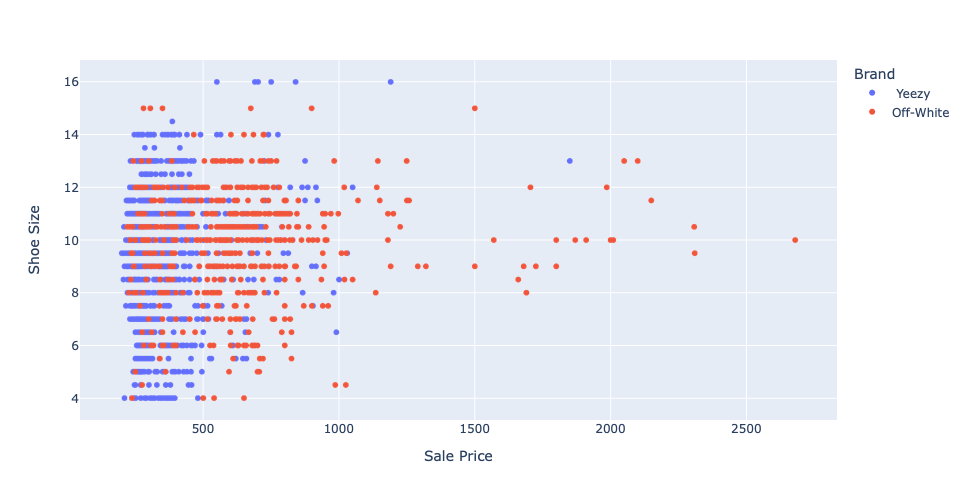

In [277]:
# Displays which shoes were sold at a certain price based on shoe size and grouped by color in the Georgia region
px.scatter(df_GA, x='Sale Price', y='Shoe Size', hover_name='Sneaker Name', color = 'Brand', height=500)